## Decision Tree using Credit Card Defualt Dataset

### Dataset: 

This dataset contains information on default payments, demographic factors, credit data, history of payment, and bill statements of credit card clients in Taiwan from April 2005 to September 2005. 

### Attribute Information

There are 25 variables

1. ID: ID of each client
2. LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit
3. SEX: Gender (1=male, 2=female)
4. EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
5. MARRIAGE: Marital status (1=married, 2=single, 3=others)
6. AGE: Age in years
7. PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, ... 8=payment delay for eight months, 9=payment delay for nine months and above)
8. PAY_2: Repayment status in August, 2005 (scale same as above)
9. PAY_3: Repayment status in July, 2005 (scale same as above)
10. PAY_4: Repayment status in June, 2005 (scale same as above)
11. PAY_5: Repayment status in May, 2005 (scale same as above)
12. PAY_6: Repayment status in April, 2005 (scale same as above)
13. BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
14. BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
15. BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
16. BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
17. BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
18. BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
19. PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
20. PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
21. PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
22. PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
23. PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
24. PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
25. default.payment.next.month: Default payment (1=yes, 0=no)

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
pd.set_option("display.max_columns", 30)

In [3]:
credit_card= pd.read_csv("C:/Users/bhave/01. Supervised Learning/pandas_for_everyone-master/data/UCI_Credit_Card.csv")
credit_card.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,-2,-2,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,0,0,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,0,0,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,0,0,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
credit_card.shape

(30000, 25)

In [5]:
credit_card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
ID                            30000 non-null int64
LIMIT_BAL                     30000 non-null float64
SEX                           30000 non-null int64
EDUCATION                     30000 non-null int64
MARRIAGE                      30000 non-null int64
AGE                           30000 non-null int64
PAY_0                         30000 non-null int64
PAY_2                         30000 non-null int64
PAY_3                         30000 non-null int64
PAY_4                         30000 non-null int64
PAY_5                         30000 non-null int64
PAY_6                         30000 non-null int64
BILL_AMT1                     30000 non-null float64
BILL_AMT2                     30000 non-null float64
BILL_AMT3                     30000 non-null float64
BILL_AMT4                     30000 non-null float64
BILL_AMT5                     30000 non-null float64
BILL_AMT6   

### Q.2. Perform Data Cleaning, if any needed.

In [6]:
# Categorical Variables Description
credit_card[['SEX', 'EDUCATION', 'MARRIAGE']].describe()

,SEX,EDUCATION,MARRIAGE
count,30000.000000,30000.000000,30000.000000
mean,1.603733,1.853133,1.551867
std,0.489129,0.790349,0.521970
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000
50%,2.000000,2.000000,2.000000
75%,2.000000,2.000000,2.000000
max,2.000000,6.000000,3.000000


#### Inferences: 
1. 0 is undocumented in EDUCATION and MARRIAGE
2. Category 5 and 6 are unlabelled in EDUCATION

In [7]:
# Payment Delay Description

credit_card[['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']].describe()

,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100
std,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988
min,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000
25%,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000


#### Inferences:
1. All have an undocumented lable, -2. -1 represents 'pay duly'. Therefore, any negative value represents 'pay duly'.
2. PAY starts from 0 and continues from 2 to 6. Therefore, we rename PAY_0 to PAY_1

In [8]:
credit_card= credit_card.rename(columns={'PAY_0': 'PAY_1'})
credit_card.loc[credit_card.EDUCATION >= 4, 'EDUCATION']= 0
credit_card.loc[credit_card.MARRIAGE==0, 'MARRIAGE']= 3

In [9]:
# Bill Description 

credit_card[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].describe()

,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6
count,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000
mean,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400
std,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537
min,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000
25%,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000
50%,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000
75%,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000
max,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000


#### Inference: Negative value indicates 'credit'?!

In [10]:
credit_card.drop(columns='ID')

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,20000.0,2,2,1,24,2,2,-1,-1,-2,-2,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,120000.0,2,2,2,26,-1,2,0,0,0,2,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,90000.0,2,2,2,34,0,0,0,0,0,0,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,50000.0,2,2,1,37,0,0,0,0,0,0,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,50000.0,1,2,1,57,-1,0,-1,0,0,0,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,0,188948.0,192815.0,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,0,1683.0,1828.0,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
29997,30000.0,1,2,2,37,4,3,2,-1,0,0,3565.0,3356.0,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
29998,80000.0,1,3,1,41,1,-1,0,0,0,-1,-1645.0,78379.0,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


### Q.3. Perform Uni-variate Analysis for categorical and continuous features

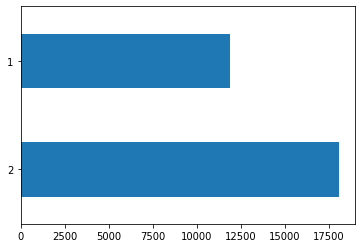

In [11]:
credit_card.SEX.value_counts().plot(kind= 'barh')

In [12]:
credit_card.SEX.value_counts()

2    18112
1    11888
Name: SEX, dtype: int64

[Text(0, 0, 'unknown'),
 Text(0, 0, 'graduate school'),
 Text(0, 0, 'university'),
 Text(0, 0, 'high school')]

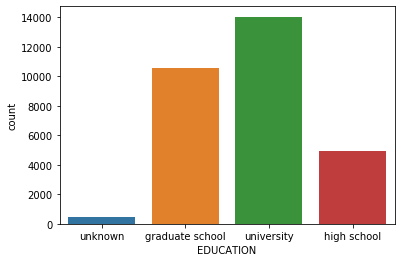

In [13]:
fig= sns.countplot(x= 'EDUCATION', data= credit_card)
fig.set_xticklabels(['unknown', 'graduate school', 'university', 'high school'])

In [14]:
credit_card.EDUCATION.value_counts()

2    14030
1    10585
3     4917
0      468
Name: EDUCATION, dtype: int64

[Text(0, 0, 'MARRIED'), Text(0, 0, 'SINGLE'), Text(0, 0, 'OTHERS')]

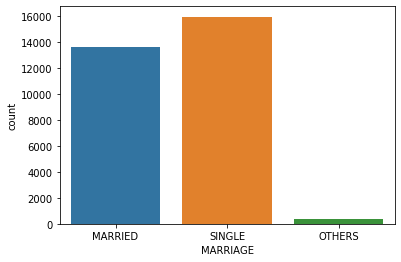

In [15]:
fig= sns.countplot(x= 'MARRIAGE', data= credit_card)
fig.set_xticklabels(['MARRIED', 'SINGLE', 'OTHERS'])

In [16]:
credit_card.EDUCATION.value_counts()

2    14030
1    10585
3     4917
0      468
Name: EDUCATION, dtype: int64

In [17]:
credit_card.LIMIT_BAL.describe()

count      30000.000000
mean      167484.322667
std       129747.661567
min        10000.000000
25%        50000.000000
50%       140000.000000
75%       240000.000000
max      1000000.000000
Name: LIMIT_BAL, dtype: float64

C:\Users\bhave\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\bhave\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\bhave\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\bhave\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\Users\bhave\Anaconda3\lib\si

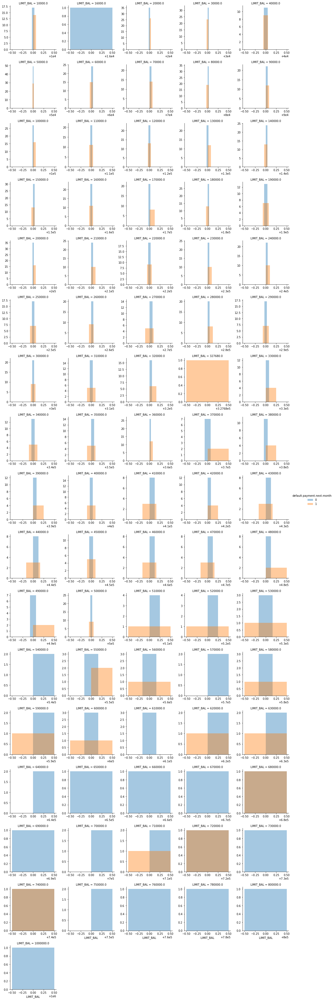

In [18]:
g = sns.FacetGrid(credit_card, hue= 'default.payment.next.month', col='LIMIT_BAL', col_wrap=5, sharex=False, sharey=False )
g = g.map( sns.distplot, "LIMIT_BAL", kde=True).add_legend()

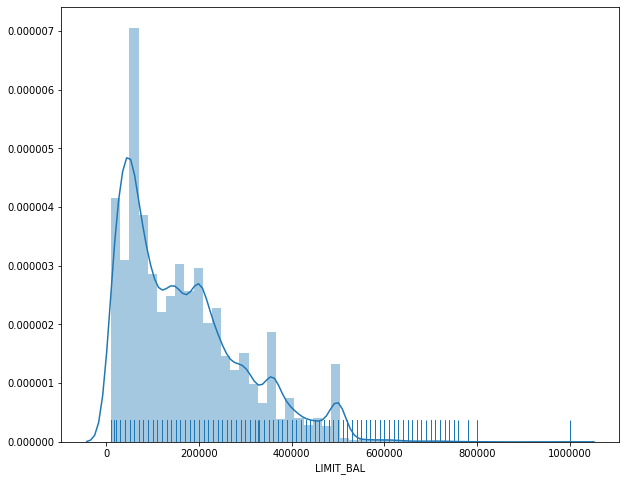

In [19]:
hist, ax= plt.subplots(figsize=(10,8))
ax= sns.distplot(credit_card['LIMIT_BAL'], rug=True)
plt.show()

#### Inference: Defaults have higer proportion at low LIMIT_BAL

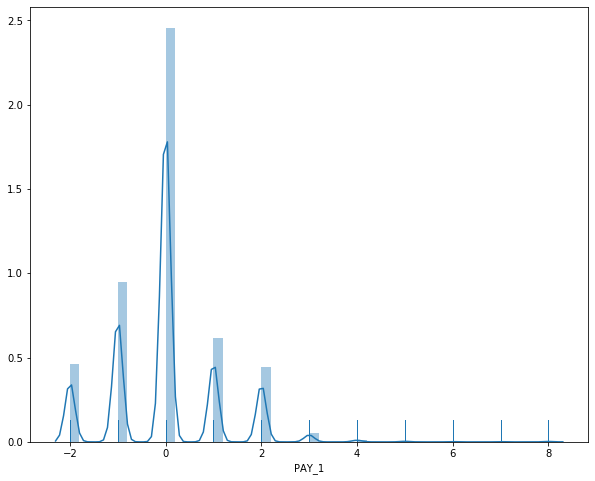

In [20]:
hist, ax= plt.subplots(figsize=(10,8))
ax= sns.distplot(credit_card['PAY_1'], rug=True)
plt.show()

#### Inference: Non-defualts have higher proportion for 0 and -1 i.e. individuals are on-time ahead in their payments for current month

### Q.4. Perform Bi-variate Analysis:
1. 2 categorical w.r.t target
2. categorical to categorical
3. categorical to continuous
4. continuous w.r.t target
5. continuous to continuous.

#### 4.i. Categorical w.r.t Target: Defualters based on Education

Text(0, 0.5, 'Percentage')

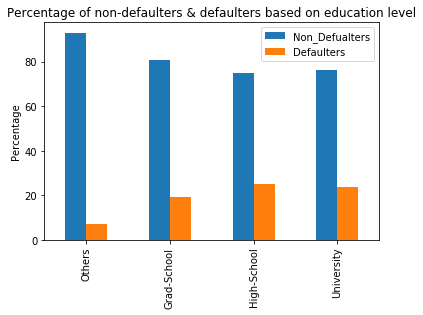

In [21]:
grad_school= credit_card['EDUCATION'][credit_card['EDUCATION']==1].count()
grad_school_default= credit_card['EDUCATION'][(credit_card['EDUCATION']==1) & 
                                              (credit_card['default.payment.next.month'])].count()

university= credit_card['EDUCATION'][credit_card['EDUCATION']==2].count()
university_defualt= credit_card['EDUCATION'][(credit_card['EDUCATION']==2) & 
                                            (credit_card['default.payment.next.month'])].count()

high_school= credit_card['EDUCATION'][credit_card['EDUCATION']==3].count()
high_school_defualt= credit_card['EDUCATION'][(credit_card['EDUCATION']==3) & 
                                            (credit_card['default.payment.next.month'])].count()

others= credit_card['EDUCATION'][credit_card['EDUCATION']==0].count()
others_defualt= credit_card['EDUCATION'][(credit_card['EDUCATION']==0) & 
                                            (credit_card['default.payment.next.month'])].count()

percent_grad_def= round((grad_school_default/ grad_school)*100, 2)
percent_uni_def= round((university_defualt/ university)* 100, 2)
percent_high_school_def= round((high_school_defualt/ high_school)* 100, 2)
percent_others_def= round((others_defualt/ others)*100, 2)

temp_df= pd.DataFrame({"Non_Defualters": {"Others": 100-percent_others_def, "Grad-School": 100- percent_grad_def,
                                         "High-School": 100- percent_high_school_def, "University": 100- percent_uni_def},
                      "Defaulters":{"Others": percent_others_def, "Grad-School": percent_grad_def,
                                         "High-School": percent_high_school_def, "University": percent_uni_def}})


fig= temp_df.plot(kind= 'bar')
fig.set_title("Percentage of non-defaulters & defaulters based on education level")
fig.set_ylabel("Percentage")

#### 4.i. Categorical w.r.t Target: Defualters based on Marital Status

Text(0, 0.5, 'Percentage')

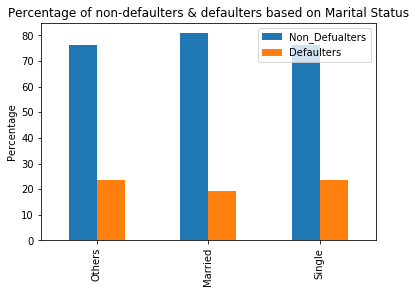

In [22]:
married= credit_card['MARRIAGE'][credit_card['MARRIAGE']==1].count()
married_default= credit_card['MARRIAGE'][(credit_card['MARRIAGE']==1) & 
                                              (credit_card['default.payment.next.month'])].count()

single= credit_card['MARRIAGE'][credit_card['MARRIAGE']==2].count()
single_defualt= credit_card['MARRIAGE'][(credit_card['MARRIAGE']==2) & 
                                            (credit_card['default.payment.next.month'])].count()

others= credit_card['MARRIAGE'][credit_card['MARRIAGE']==3].count()
others_defualt= credit_card['MARRIAGE'][(credit_card['MARRIAGE']==3) & 
                                            (credit_card['default.payment.next.month'])].count()

percent_married_def= round((grad_school_default/ grad_school)*100, 2)
percent_single_def= round((university_defualt/ university)* 100, 2)
percent_others_def= round((others_defualt/ others)*100, 2)

temp_df= pd.DataFrame({"Non_Defualters": {"Others": 100-percent_others_def, "Married": 100- percent_married_def,
                                         "Single": 100- percent_single_def},
                      "Defaulters":{"Others": percent_others_def, "Married": percent_married_def,
                                         "Single": percent_single_def}})


fig= temp_df.plot(kind= 'bar')
fig.set_title("Percentage of non-defaulters & defaulters based on Marital Status")
fig.set_ylabel("Percentage")

#### 4.iv. Continuous w.r.t Target 

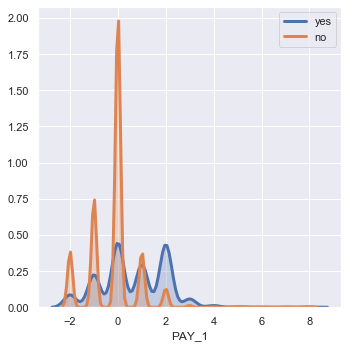

In [23]:
sns.set(rc={'figure.figsize':(5,5)})

sns.distplot(credit_card.loc[credit_card['default.payment.next.month']==1, 'PAY_1'], hist= False, kde= True,
            kde_kws={'shade': True, 'linewidth':3}, label='yes')

sns.distplot(credit_card.loc[credit_card['default.payment.next.month']==0, 'PAY_1'], hist= False, kde= True,
            kde_kws={'shade': True, 'linewidth':3}, label='no')

plt.tight_layout()
plt.show()

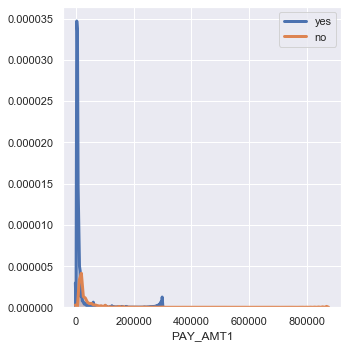

In [24]:
sns.set(rc={'figure.figsize':(5,5)})

sns.distplot(credit_card.loc[credit_card['default.payment.next.month']==1, 'PAY_AMT1'], hist= False, kde= True,
            kde_kws={'shade': True, 'linewidth':3}, label='yes')

sns.distplot(credit_card.loc[credit_card['default.payment.next.month']==0, 'PAY_AMT1'], hist= False, kde= True,
            kde_kws={'shade': True, 'linewidth':3}, label='no')

plt.tight_layout()
plt.show()

#### 4.v. Continuous v/s Continuous Variable

C:\Users\bhave\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  import sys


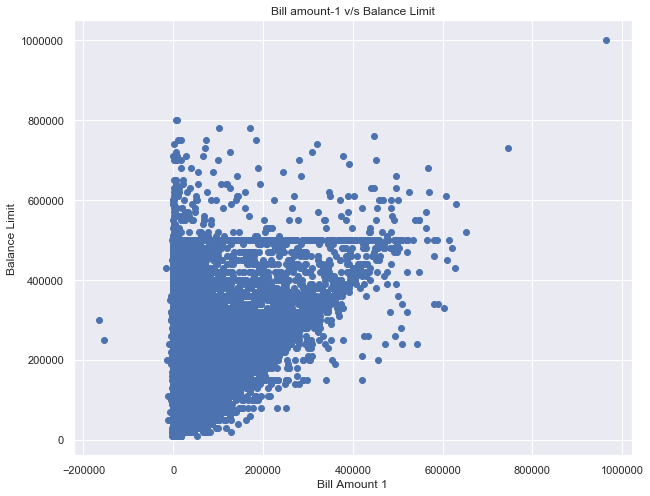

In [25]:
scatter_plot= plt.figure(figsize=(10,8))
axes1= scatter_plot.add_subplot(1,1,1)
axes1.scatter(credit_card['BILL_AMT1'], credit_card['LIMIT_BAL'])
axes1.set_title("Bill amount-1 v/s Balance Limit")
axes1.set_xlabel("Bill Amount 1")
axes1.set_ylabel("Balance Limit")
scatter_plot.show()

C:\Users\bhave\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  import sys


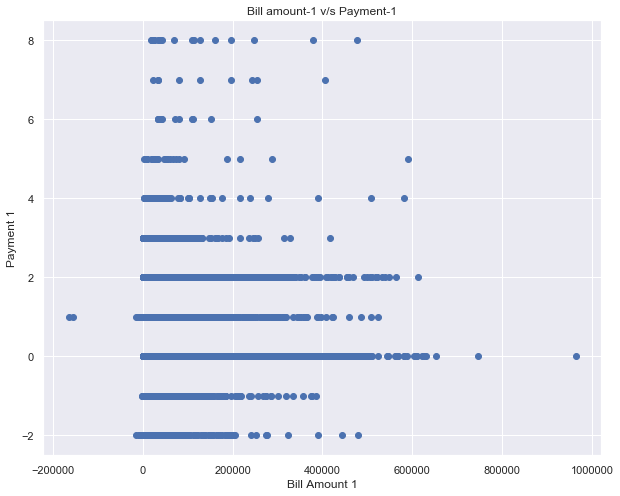

In [26]:
scatter_plot= plt.figure(figsize=(10,8))
axes1= scatter_plot.add_subplot(1,1,1)
axes1.scatter(credit_card['BILL_AMT1'], credit_card['PAY_1'])
axes1.set_title("Bill amount-1 v/s Payment-1")
axes1.set_xlabel("Bill Amount 1")
axes1.set_ylabel("Payment 1")
scatter_plot.show()

#### 4.iii. Categorical to Continuous

C:\Users\bhave\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  # This is added back by InteractiveShellApp.init_path()


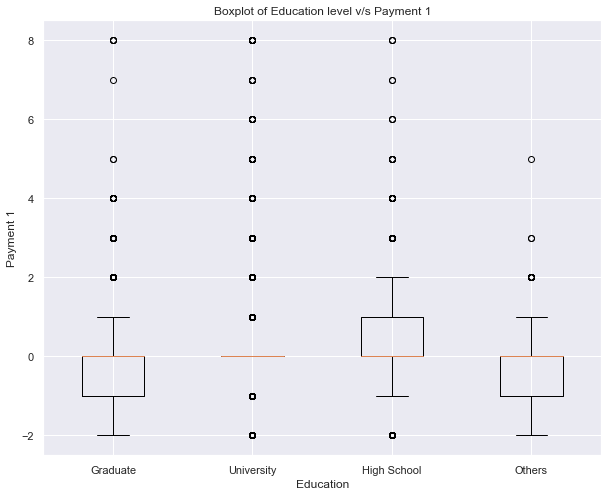

In [27]:
boxplot= plt.figure(figsize=(10,8))
axes1= boxplot.add_subplot(1,1,1)
axes1.boxplot([credit_card[credit_card['EDUCATION']== 1]['PAY_1'],
              credit_card[credit_card['EDUCATION']==2]['PAY_1'],
              credit_card[credit_card['EDUCATION']==3]['PAY_1'],
              credit_card[credit_card['EDUCATION']==0]['PAY_1']],
             labels= ['Graduate', 'University', 'High School', 'Others'])
axes1.set_xlabel('Education')
axes1.set_ylabel('Payment 1')
axes1.set_title('Boxplot of Education level v/s Payment 1')
boxplot.show()

C:\Users\bhave\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  # Remove the CWD from sys.path while we load stuff.


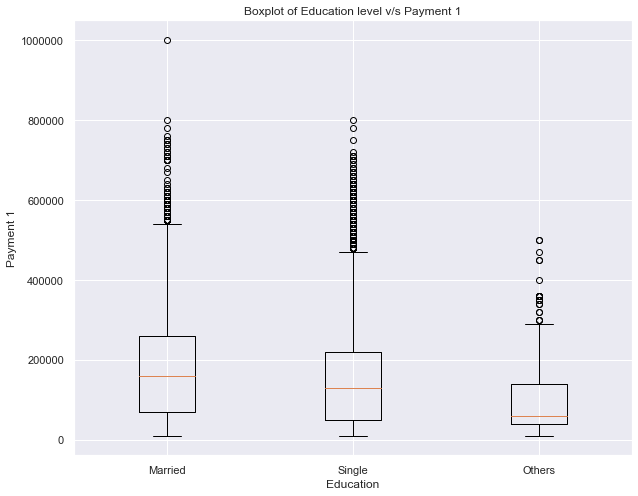

In [28]:
boxplot= plt.figure(figsize=(10,8))
axes1= boxplot.add_subplot(1,1,1)
axes1.boxplot([credit_card[credit_card['MARRIAGE']== 1]['LIMIT_BAL'],
              credit_card[credit_card['MARRIAGE']==2]['LIMIT_BAL'],
              credit_card[credit_card['MARRIAGE']==3]['LIMIT_BAL']],
             labels= ['Married', 'Single', 'Others'])
axes1.set_xlabel('Education')
axes1.set_ylabel('Payment 1')
axes1.set_title('Boxplot of Education level v/s Payment 1')
boxplot.show()

#### 4.ii. Categorical v/s Categorical 

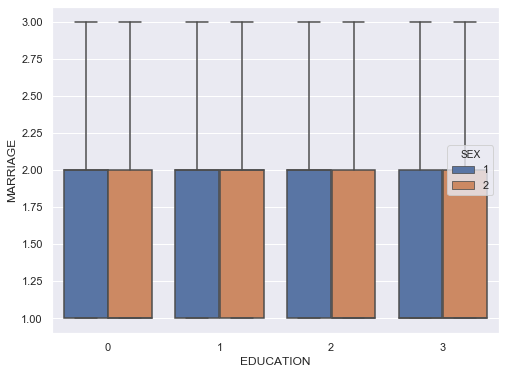

In [29]:
fig, ax1 = plt.subplots(ncols=1, figsize=(8,6))
s = sns.boxplot(ax = ax1, x= credit_card['EDUCATION'], y=credit_card['MARRIAGE'], hue= credit_card['SEX'],
                data=credit_card,showfliers=False)
s.set_xticklabels(s.get_xticklabels())
plt.show();

### Q.5. Normalize the features (categorical and continuous)

Categorical Features are already in numercial format.

In [30]:
credit_card.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_1',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [31]:
continuous_features= ['LIMIT_BAL', 'PAY_1','PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 
                      'BILL_AMT1', 'BILL_AMT2','BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6',
                      'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']

In [32]:
from sklearn.preprocessing import MinMaxScaler
minmax= MinMaxScaler()
cc_data= credit_card
cc_data[continuous_features]= minmax.fit_transform(credit_card[continuous_features].values)
cc_data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,0.010101,2,2,1,24,0.4,0.4,0.1,0.1,0.0,0.0,0.149982,0.069164,0.086723,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000,1
1,2,0.111111,2,2,2,26,0.1,0.4,0.2,0.2,0.2,0.4,0.148892,0.067858,0.087817,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783,1
2,3,0.080808,2,2,2,34,0.2,0.2,0.2,0.2,0.2,0.2,0.172392,0.079532,0.093789,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458,0
3,4,0.040404,2,2,1,37,0.2,0.2,0.2,0.2,0.2,0.2,0.188100,0.111995,0.113407,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892,0
4,5,0.040404,1,2,1,57,0.1,0.2,0.1,0.2,0.2,0.2,0.154144,0.071601,0.106020,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284,0


### Q.6. Use K-Fold cross validation for train and test split in data

In [33]:
target= pd.DataFrame(cc_data['default.payment.next.month'])
cc_data= cc_data.drop('default.payment.next.month', axis=1)

In [34]:
from sklearn.model_selection import StratifiedKFold

folds= StratifiedKFold(n_splits= 5, shuffle= True, random_state= 0)
for train_index, test_index in folds.split(cc_data, target):
    X_train, X_test= cc_data.iloc[train_index], cc_data.iloc[test_index]
    Y_train, Y_test= target.iloc[train_index], target.iloc[test_index]

### Model Building: Decision Tree Classifier

In [35]:
from sklearn.tree import DecisionTreeClassifier
model= DecisionTreeClassifier()

In [36]:
model.fit(X_train, Y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [37]:
predicted= model.predict(X_test)

### Q.7. Plot confusion matrix, classification report

#### Confusion Matrix

In [38]:
from sklearn.metrics import confusion_matrix, classification_report

In [39]:
confusion_m= confusion_matrix(Y_test, predicted)
print("Confusion Matrix:", confusion_m)

Confusion Matrix: [[3805  867]
 [ 794  533]]


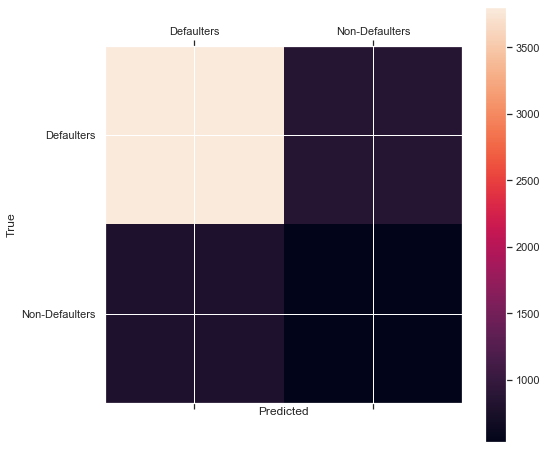

In [40]:
labels= ['Defaulters', 'Non-Defaulters']
fig= plt.figure(figsize=(8,8))
ax= fig.add_subplot(1,1,1)
cax= ax.matshow(confusion_m)
fig.colorbar(cax)
ax.set_xticklabels([''] + labels)
ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

#### Classification Report

In [41]:
class_report= classification_report(Y_test, predicted)
print(class_report)

             precision    recall  f1-score   support

          0       0.83      0.81      0.82      4672
          1       0.38      0.40      0.39      1327

avg / total       0.73      0.72      0.73      5999



#### Q.8. Check Accuracy Score

In [42]:
from sklearn.metrics import accuracy_score
print("Accuracy score of Decision Tree Classifier: ", accuracy_score(Y_test, predicted))

Accuracy score of Decision Tree Classifier:  0.7231205200866812


### Q.9. Plot the decision tree graph using graphviz

In [43]:
from sklearn import tree
import graphviz

In [44]:
feature_names= cc_data.columns
target_names= ['Default', 'No Default']

In [45]:
from sklearn.tree import export_graphviz
dt= export_graphviz(model, out_file= None, feature_names= feature_names, class_names= target_names,
                   filled= True, rounded= True)
graph= graphviz.Source(dt)
graph

### Q.10. Hyper-tune parameters
1. sample_split_range
2. criterion
3. min_samples_leaf
4. min_samples_split
5. splitter.

In [46]:
from sklearn.model_selection import GridSearchCV

In [48]:
sample_split_range= range(10,50,100)
para_grid= dict(min_samples_split= sample_split_range)
grid_dtc= GridSearchCV(model, para_grid, cv=10, scoring= 'accuracy')
grid_dtc.fit(X_train, Y_train)

GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'min_samples_split': range(10, 50, 100)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='accuracy', verbose=0)

In [49]:
grid_pred= grid_dtc.predict(X_test)
grid_probability= grid_dtc.predict_proba(X_test)

In [50]:
grid_confusion_m= confusion_matrix(Y_test, grid_pred)
print("confusion matrix:", grid_confusion_m)

confusion matrix: [[3938  734]
 [ 816  511]]


In [54]:
dtc= DecisionTreeClassifier(criterion= 'entropy', min_samples_split= 3, random_state= 0)
dtc.fit(X_train, Y_train)
pred= dtc.predict(X_test)
print("accuracy with min sample split of 3:", accuracy_score(Y_test, pred))

accuracy with min sample split of 3: 0.723287214535756


In [58]:
dtc= DecisionTreeClassifier(min_samples_leaf= 8, min_samples_split= 3, random_state= 0)
dtc.fit(X_train, Y_train)
pred= dtc.predict(X_test)
print("accuracy with min sample split of 3:", accuracy_score(Y_test, pred))

accuracy with min sample split of 3: 0.77296216036006


In [60]:
dtc= DecisionTreeClassifier(min_samples_split= 3, random_state= 0, splitter= 'random')
dtc.fit(X_train, Y_train)
pred= dtc.predict(X_test)
print("accuracy with min sample split of 3:", accuracy_score(Y_test, pred))

accuracy with min sample split of 3: 0.7309551591931989
